In [4]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
import time
import cv2

# Question 1 : Fourier Transform

## 1.1

In [199]:
def dft1(signal):
    """
    Calculate the Discrete Fourier Transform (DFT) of a 1D array.
    
    Parameters:
    signal (np.ndarray): Input 1D array (time-domain signal).
    
    Returns:
    np.ndarray: Complex numbers representing the DFT.
    """
    N = len(signal)
    dft_result = np.zeros(N, dtype=complex)
    n = np.arange(N)

    for k in range(N):
        dft_result[k] = np.sum(signal * np.exp(-2j * np.pi * k * n / N))

    return dft_result

In [200]:
# Load the audio file
file_path = '../data/1.wav'
signal, sr = librosa.load(file_path, sr=None)

print(sr)

# Compute the DFT
dft_result = dft1(signal)

44100


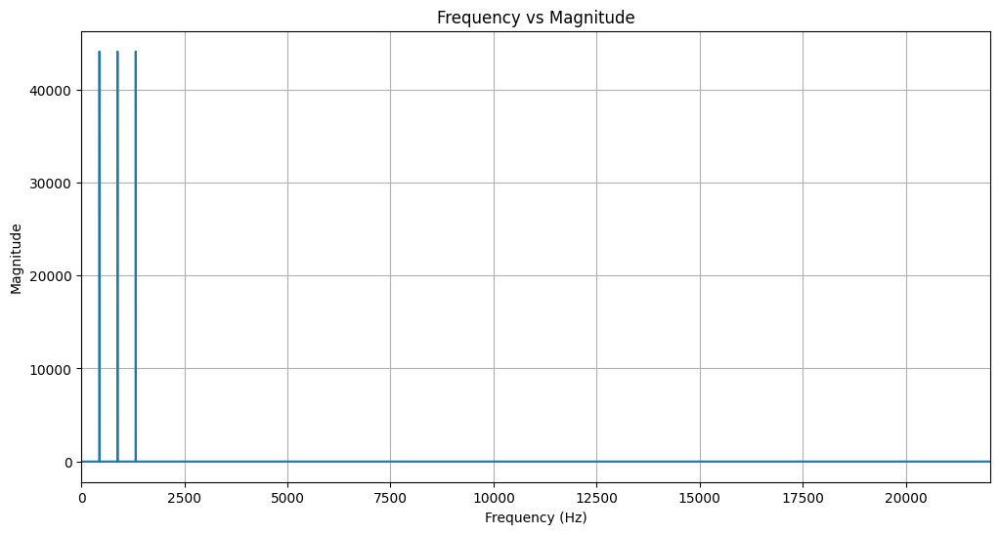

In [201]:
# Manually calculate the frequency bins
N = len(dft_result)
frequencies = np.arange(N) * (sr / N)

# Calculate magnitude
magnitude = np.abs(dft_result)

# Plot frequency vs magnitude
plt.figure(figsize=(12, 6))
plt.plot(frequencies[:N//2], magnitude[:N//2])  # Plot only the positive frequencies
plt.title('Frequency vs Magnitude')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.xlim(0, sr / 2)  # Limit x-axis to Nyquist frequency
plt.grid()
plt.show()

In [214]:
# Number of largest magnitudes to extract
num_largest = 10  # For example, top 5 frequencies

# Get indices of the largest magnitudes
largest_indices = np.argsort(magnitude)[-num_largest:][::-1]  # Sort and take largest in descending order

# Extract the largest magnitudes and corresponding frequencies
largest_magnitudes = magnitude[largest_indices]
corresponding_frequencies = frequencies[largest_indices]

# Display the results
for i in range(num_largest):
    print(f"Frequency: {corresponding_frequencies[i]:.2f} Hz, Magnitude: {largest_magnitudes[i]:.2f}")

Frequency: 43660.00 Hz, Magnitude: 44107.03
Frequency: 440.00 Hz, Magnitude: 44107.03
Frequency: 1320.00 Hz, Magnitude: 44106.90
Frequency: 42780.00 Hz, Magnitude: 44106.90
Frequency: 880.00 Hz, Magnitude: 44106.89
Frequency: 43220.00 Hz, Magnitude: 44106.89
Frequency: 0.00 Hz, Magnitude: 3.36
Frequency: 31620.00 Hz, Magnitude: 0.13
Frequency: 12480.00 Hz, Magnitude: 0.13
Frequency: 24360.00 Hz, Magnitude: 0.12


## 1.2

In [5]:
def dft2(image):
    """
    Calculate the 2D Discrete Fourier Transform (DFT) of a 2D array.
    
    Parameters:
    image (np.ndarray): Input 2D array (image).
    
    Returns:
    np.ndarray: Complex numbers representing the 2D DFT.
    """
    # Get the shape of the input image
    rows, cols = image.shape
    
    # Initialize the result array
    dft_result = np.zeros((rows, cols), dtype=complex)

    # Apply the 1D DFT along the rows
    for r in range(rows):
        dft_result[r, :] = dft1(image[r, :])
    
    # Apply the 1D DFT along the columns
    for c in range(cols):
        dft_result[:, c] = dft1(dft_result[:, c])
    
    return dft_result

## 1.3

In [6]:
def fft1(signal):
    """
    Compute the Fast Fourier Transform (FFT) of a 1D array.
    
    Parameters:
    signal (np.ndarray): Input 1D array (time-domain signal).
    
    Returns:
    np.ndarray: Complex numbers representing the FFT.
    """
    # Pad the array to the nearest power of 2
    n = len(signal)
    N = 1
    while N < n:
        N *= 2
    padded_signal = np.pad(signal, (0, N - n), mode='constant')

    # FFT recursive function
    def fft_recursive(x):
        N = len(x)
        if N <= 1:
            return x
        even = fft_recursive(x[0::2])  # FFT of even indexed elements
        odd = fft_recursive(x[1::2])   # FFT of odd indexed elements
        
        # Combine results
        combined = np.zeros(N, dtype=complex)
        for k in range(N // 2):
            t = np.exp(-2j * np.pi * k / N) * odd[k]
            combined[k] = even[k] + t
            combined[k + N // 2] = even[k] - t
        return combined
    
    # Compute the FFT
    fft_result = fft_recursive(padded_signal)
    
    return fft_result

## 1.4

In [7]:
def fft2(image):
    """
    Compute the 2D Fast Fourier Transform (FFT) of a 2D array.
    
    Parameters:
    image (np.ndarray): Input 2D array (image).
    
    Returns:
    np.ndarray: Complex numbers representing the 2D FFT.
    """
    # Get the shape of the input image
    rows, cols = image.shape
    
    # Pad the image to the nearest power of 2 in both dimensions
    padded_rows = 1
    while padded_rows < rows:
        padded_rows *= 2
    padded_cols = 1
    while padded_cols < cols:
        padded_cols *= 2
    
    padded_image = np.pad(image, ((0, padded_rows - rows), (0, padded_cols - cols)), mode='constant')

    # Apply the 1D FFT along the rows
    fft_result = np.zeros((padded_rows, padded_cols), dtype=complex)
    for r in range(padded_rows):
        fft_result[r, :] = fft1(padded_image[r, :])

    # Apply the 1D FFT along the columns
    for c in range(padded_cols):
        fft_result[:, c] = fft1(fft_result[:, c])
    
    return fft_result

## 1.5

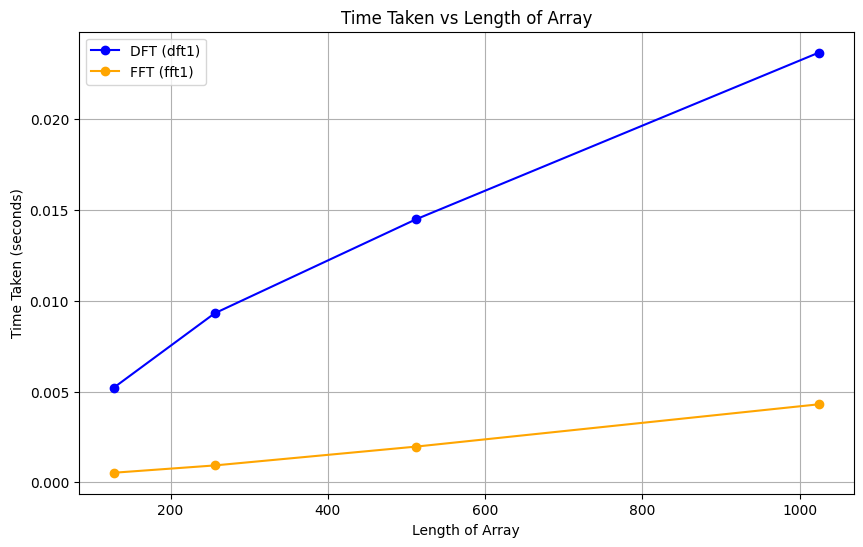

In [14]:
# Array lengths to test
lengths = [128, 256, 512, 1024]
dft_times = []
fft_times = []

# Measure time for dft1
for length in lengths:
    signal = np.random.random(length)
    
    start_time = time.time()
    dft1(signal)
    end_time = time.time()
    
    dft_times.append(end_time - start_time)

# Measure time for fft1
for length in lengths:
    signal = np.random.random(length)
    
    start_time = time.time()
    fft1(signal)
    end_time = time.time()
    
    fft_times.append(end_time - start_time)

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(lengths, dft_times, marker='o', label='DFT (dft1)', color='blue')
plt.plot(lengths, fft_times, marker='o', label='FFT (fft1)', color='orange')
plt.xlabel('Length of Array')
plt.ylabel('Time Taken (seconds)')
plt.title('Time Taken vs Length of Array')
plt.legend()
plt.grid()
plt.show()

### Differences between DFT and FFT

1. The DFT takes significantly longer than the FFT as the array length increases.
2. This is expected, as the DFT has a time complexity of O(N^2), whereas the FFT has a time complexity of O(N log N).

## 1.6

In [8]:
def shift_zero_frequency(magnitude):
    """Manually shift the zero frequency to the center"""
    rows, cols = magnitude.shape
    # Split the magnitude into quadrants
    top_left = magnitude[:rows//2, :cols//2]
    top_right = magnitude[:rows//2, cols//2:]
    bottom_left = magnitude[rows//2:, :cols//2]
    bottom_right = magnitude[rows//2:, cols//2:]

    # Swap quadrants: top-left with bottom-right, top-right with bottom-left
    magnitude_shifted = np.zeros_like(magnitude)
    magnitude_shifted[:rows//2, :cols//2] = bottom_right
    magnitude_shifted[:rows//2, cols//2:] = bottom_left
    magnitude_shifted[rows//2:, :cols//2] = top_right
    magnitude_shifted[rows//2:, cols//2:] = top_left

    return magnitude_shifted

### (1) I = 0.5(1 + sin x)

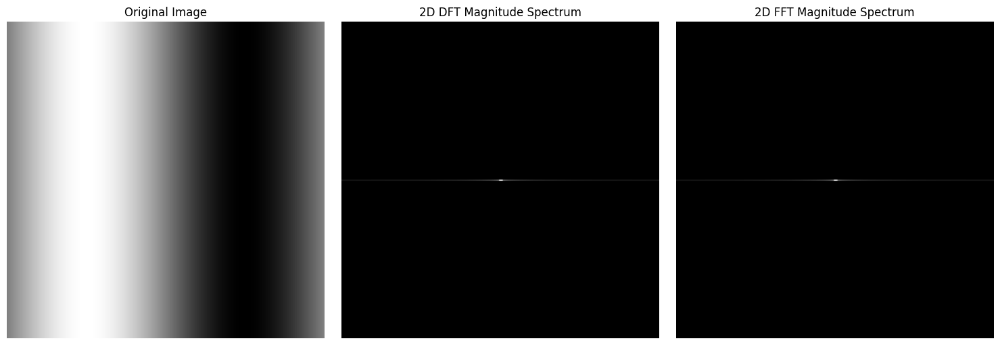

In [26]:
# Generate an example image signal
N = 256
x = np.linspace(0, 2*np.pi,N)
y = np.linspace(0, 2*np.pi,N)
X, Y = np.meshgrid(x, y)
I = 0.5 * (1 + np.sin(X))

# Compute the 2D DFT and 2D FFT
dft_result_image1 = dft2(I)
fft_result_image1 = fft2(I)

# Shift the zero frequency to the center
dft_shifted = shift_zero_frequency(dft_result_image1)
fft_shifted = shift_zero_frequency(fft_result_image1)

# dft_shifted = np.fft.fftshift(dft_result_image1)
# fft_shifted = np.fft.fftshift(fft_result_image1)

# Find magnitude
magnitude_dft_shifted = np.log(1+np.abs(dft_shifted))
magnitude_fft_shifted = np.log(1+np.abs(fft_shifted))

# Display the original image and the magnitude spectra of the 2D DFT and 2D FFT
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Original image
axs[0].imshow(I, cmap='gray')
axs[0].set_title("Original Image")
axs[0].axis('off')

# Magnitude of 2D DFT
axs[1].imshow(magnitude_dft_shifted, cmap='gray')
axs[1].set_title("2D DFT Magnitude Spectrum")
axs[1].axis('off')

# Magnitude of 2D FFT
axs[2].imshow(magnitude_fft_shifted, cmap='gray')
axs[2].set_title("2D FFT Magnitude Spectrum")
axs[2].axis('off')

plt.tight_layout()
plt.show()

### (2) I = 0.5(1 + sin x sin y)

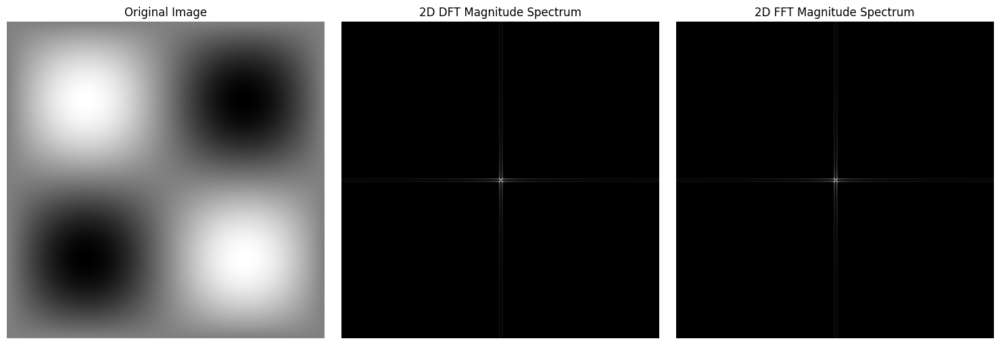

In [27]:
# Generate an example image signal
N=256
x = np.linspace(0, 2*np.pi,N)
y = np.linspace(0, 2*np.pi,N)
X, Y = np.meshgrid(x, y)
I = 0.5 * (1 + np.sin(X)* np.sin(Y))

# Compute the 2D DFT and 2D FFT
dft_result_image2 = dft2(I)
fft_result_image2 = fft2(I)

# Shift the zero frequency to the center
magnitude_dft_shifted = shift_zero_frequency(dft_result_image2)
magnitude_fft_shifted = shift_zero_frequency(fft_result_image2)

magnitude_dft = np.abs(magnitude_dft_shifted)
magnitude_fft = np.abs(magnitude_fft_shifted)

log_magnitude_dft = np.log(1 + magnitude_dft)
log_magnitude_fft = np.log(1 + magnitude_fft)

# Display the original image and the magnitude spectra of the 2D DFT and 2D FFT
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Original image
axs[0].imshow(I, cmap='gray')
axs[0].set_title("Original Image")
axs[0].axis('off')

# Magnitude of 2D DFT
axs[1].imshow(log_magnitude_dft, cmap='gray')
axs[1].set_title("2D DFT Magnitude Spectrum")
axs[1].axis('off')

# Magnitude of 2D FFT
axs[2].imshow(log_magnitude_fft, cmap='gray')
axs[2].set_title("2D FFT Magnitude Spectrum")
axs[2].axis('off')

plt.tight_layout()
plt.show()

### (3) I = 0.5(1 + sin (x2 + y2) )

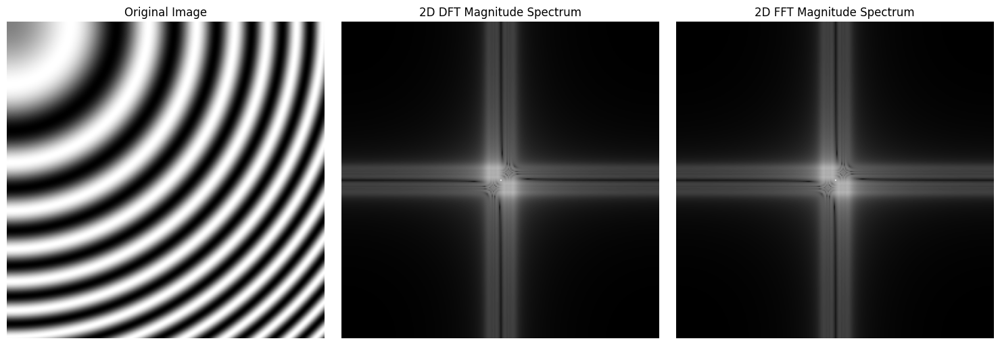

In [28]:
# Generate an example image signal
N = 256
x = np.linspace(0, 2*np.pi, N)
y = np.linspace(0, 2*np.pi, N)
X, Y = np.meshgrid(x, y)
I = 0.5 * (1 + np.sin(X**2 + Y**2))

# Compute the 2D DFT and 2D FFT
dft_result_image3 = dft2(I)
fft_result_image3 = fft2(I)

magnitude_dft_img3 = np.abs(dft_result_image3)
magnitude_fft_img3 = np.abs(fft_result_image3)

# Shift the zero frequency to the center
magnitude_dft_shifted_img3 = shift_zero_frequency(magnitude_dft_img3)
magnitude_fft_shifted_img3 = shift_zero_frequency(magnitude_fft_img3)

log_magnitude_dft_img3 = np.log(1 + magnitude_dft_shifted_img3)
log_magnitude_fft_img3 = np.log(1 + magnitude_fft_shifted_img3)

# Display the original image and the magnitude spectra of the 2D DFT and 2D FFT
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Original image
axs[0].imshow(I, cmap='gray')
axs[0].set_title("Original Image")
axs[0].axis('off')

# Magnitude of 2D DFT
axs[1].imshow(log_magnitude_dft_img3, cmap='gray')
axs[1].set_title("2D DFT Magnitude Spectrum")
axs[1].axis('off')

# Magnitude of 2D FFT
axs[2].imshow(log_magnitude_fft_img3, cmap='gray')
axs[2].set_title("2D FFT Magnitude Spectrum")
axs[2].axis('off')

plt.tight_layout()
plt.show()

## 1.7

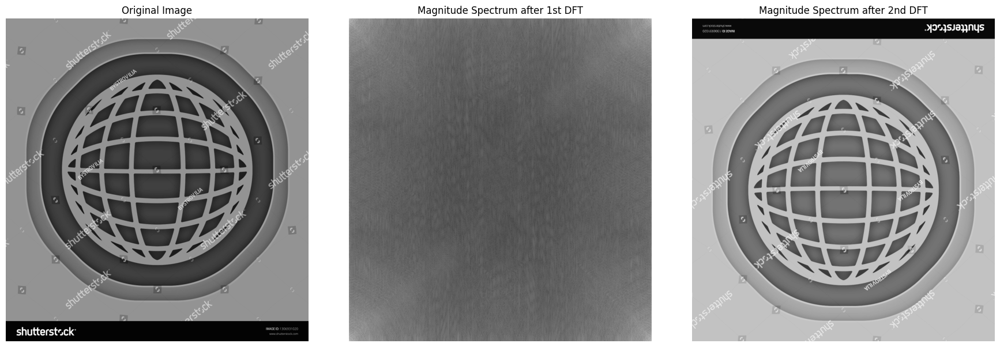

In [195]:
# Load the image in grayscale using cv2
image = cv2.imread("../data/img1.jpg", cv2.IMREAD_GRAYSCALE)

# Step 1: Compute the 2D DFT of the original image
dft_result_1 = dft2(image)

# Step 2: Compute the 2D DFT of the first DFT result
dft_result_2 = dft2(dft_result_1)

# Display the images and results
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Original Image
axs[0].imshow(image, cmap="gray")
axs[0].set_title("Original Image")
axs[0].axis("off")

# 2D DFT of the Original Image (Magnitude Spectrum)
axs[1].imshow(np.log(1 + np.abs(np.fft.fftshift(dft_result_1))), cmap="gray")
axs[1].set_title("Magnitude Spectrum after 1st DFT")
axs[1].axis("off")

# 2D DFT of the DFT Result (Magnitude Spectrum)
axs[2].imshow(np.log(1 + np.abs(dft_result_2)), cmap="gray")
axs[2].set_title("Magnitude Spectrum after 2nd DFT")
axs[2].axis("off")

plt.tight_layout()
plt.show()

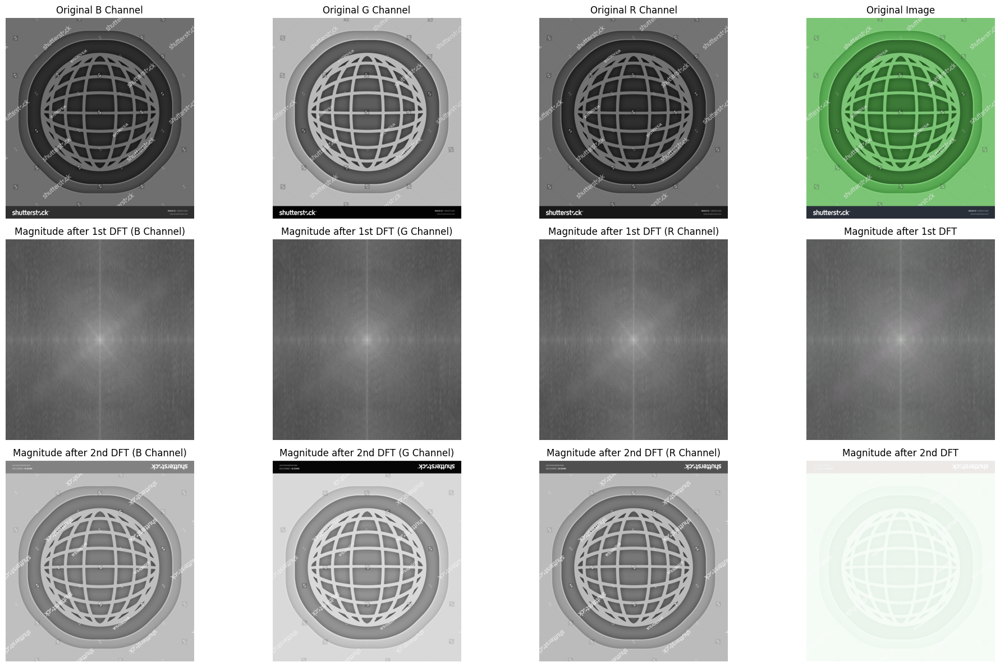

In [228]:
# Load the color image
image = cv2.imread("../data/img1.jpg")

# Split the image into B, G, R channels
b_channel, g_channel, r_channel = cv2.split(image)

# Apply 2D DFT twice to the B channel
dft_b1 = dft2(b_channel)
dft_b2 = dft2(dft_b1)

# Apply 2D DFT twice to the G channel
dft_g1 = dft2(g_channel)
dft_g2 = dft2(dft_g1)

# Apply 2D DFT twice to the R channel
dft_r1 = dft2(r_channel)
dft_r2 = dft2(dft_r1)

# Compute magnitude spectrum after the first DFT for visualization
magnitude_b = np.log(1 + np.abs(np.fft.fftshift(dft_b1)))
magnitude_g = np.log(1 + np.abs(np.fft.fftshift(dft_g1)))
magnitude_r = np.log(1 + np.abs(np.fft.fftshift(dft_r1)))

# Merge the transformed channels
merged_magnitude = cv2.merge([magnitude_b, magnitude_g, magnitude_r])

# Compute the magnitude spectrum after the second DFT for visualization
magnitude_b_2 = np.log(1 + np.abs(dft_b2))
magnitude_g_2 = np.log(1 + np.abs(dft_g2))
magnitude_r_2 = np.log(1 + np.abs(dft_r2))

# Merge the transformed channels
merged_magnitude_2 = cv2.merge([magnitude_b_2, magnitude_g_2, magnitude_r_2])

# Display the original channels, first DFT results, and final merged DFT results
fig, axs = plt.subplots(3, 4, figsize=(20, 12))

# Original channels
axs[0, 0].imshow(b_channel, cmap="gray")
axs[0, 0].set_title("Original B Channel")
axs[0, 1].imshow(g_channel, cmap="gray")
axs[0, 1].set_title("Original G Channel")
axs[0, 2].imshow(r_channel, cmap="gray")
axs[0, 2].set_title("Original R Channel")

# First DFT Magnitude Spectrum
axs[1, 0].imshow(np.log(1 + np.abs(np.fft.fftshift(dft_b1))), cmap="gray")
axs[1, 0].set_title("Magnitude after 1st DFT (B Channel)")
axs[1, 1].imshow(np.log(1 + np.abs(np.fft.fftshift(dft_g1))), cmap="gray")
axs[1, 1].set_title("Magnitude after 1st DFT (G Channel)")
axs[1, 2].imshow(np.log(1 + np.abs(np.fft.fftshift(dft_r1))), cmap="gray")
axs[1, 2].set_title("Magnitude after 1st DFT (R Channel)")

# Second DFT Magnitude Spectrum
axs[2, 0].imshow(magnitude_b_2, cmap="gray")
axs[2, 0].set_title("Magnitude after 2nd DFT (B Channel)")
axs[2, 1].imshow(magnitude_g_2, cmap="gray")
axs[2, 1].set_title("Magnitude after 2nd DFT (G Channel)")
axs[2, 2].imshow(magnitude_r_2, cmap="gray")
axs[2, 2].set_title("Magnitude after 2nd DFT (R Channel)")

# Final Merged Magnitude Spectrum
axs[0, 3].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axs[0, 3].set_title("Original Image")
axs[1, 3].imshow(merged_magnitude / np.max(merged_magnitude))
axs[1, 3].set_title("Magnitude after 1st DFT")
axs[2, 3].imshow(merged_magnitude_2 / np.max(merged_magnitude_2))
axs[2, 3].set_title("Magnitude after 2nd DFT")

# Adjust layout
for ax in axs.flat:
    ax.axis("off")

plt.tight_layout()
plt.show()

### Observations
#### Original Image
- Shows a spherical grid pattern (globe-like structure)
- Has clear geometric patterns with strong edges
- Grayscale image with good contrast

#### First DFT (Magnitude Spectrum)
- Shows vertical striping pattern. This indicates strong periodic components in the horizontal direction of the original image
- The brightness represents the strength of different frequency components. 
- The vertical patterns correspond to the horizontal grid lines in the original image

#### Second DFT (Final Result)
- Interestingly, the second DFT produces an image that looks very similar to the original image. This demonstrates the "inverse property" of the Fourier transform. When applied twice, the DFT essentially performs a flipped version of the original image.
- This behavior is related to a fundamental property of the Fourier transform: applying it four times returns the original image. The second application thus produces a flipped version of the original. This is because:
    - First DFT converts the image from spatial domain to frequency domain
    - Second DFT treats the frequency spectrum as a spatial image and converts it back to something resembling the spatial domain, but flipped


# Question 2 : Inverse Fourier Transform

## 2.1

In [37]:
def ifft1(spectrum):
    """
    Compute the Inverse Fast Fourier Transform (IFFT) of a 1D array.
    
    Parameters:
    spectrum (np.ndarray): Input 1D array of complex numbers (frequency-domain signal).
    
    Returns:
    np.ndarray: Real numbers representing the inverse FFT (time-domain signal).
    """
    # Pad the array to the nearest power of 2
    n = len(spectrum)
    N = 1
    while N < n:
        N *= 2
    padded_spectrum = np.pad(spectrum, (0, N - n), mode='constant')
    
    # IFFT recursive function
    def ifft_recursive(x):
        N = len(x)
        if N <= 1:
            return x
        
        # Split into even and odd indices
        even = ifft_recursive(x[0::2])
        odd = ifft_recursive(x[1::2])
        
        # Combine results
        # Note the positive exponent (2j instead of -2j) compared to FFT
        combined = np.zeros(N, dtype=complex)
        for k in range(N // 2):
            t = np.exp(2j * np.pi * k / N) * odd[k]
            combined[k] = even[k] + t
            combined[k + N // 2] = even[k] - t
            
        return combined
    
    # Compute the IFFT and normalize by N
    ifft_result = ifft_recursive(padded_spectrum) / N
    
    # Return only the first n elements (remove padding)
    # Take real part if the signal should be real
    return ifft_result[:n]

In [38]:
# Load the audio file
file_path = '../data/1.wav'
signal, sr = librosa.load(file_path, sr=None)

N = len(signal)

# Calculate the IFFT of the DFT result
fft_signal = fft1(signal)

In [39]:
ifft_signal = ifft1(fft_signal)

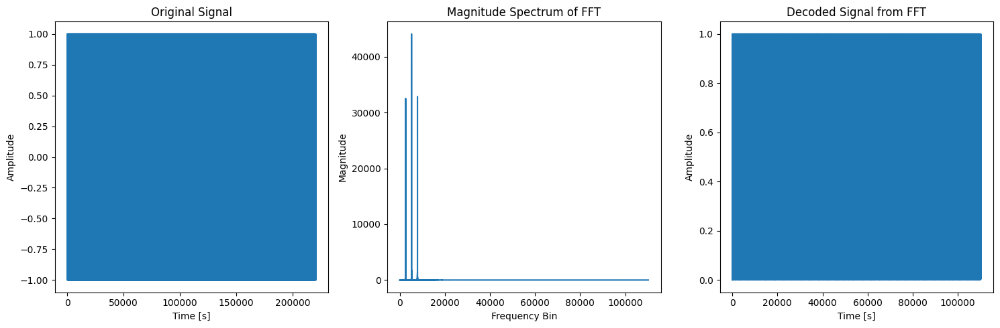

In [43]:
# Plotting
plt.figure(figsize=(15, 5))

# Original Signal
plt.subplot(1, 3, 1)
plt.plot(signal)
plt.title('Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

# Magnitude Spectrum of DFT
plt.subplot(1, 3, 2)
plt.plot(np.abs(fft_signal[:N//2]))
plt.title('Magnitude Spectrum of FFT')
plt.xlabel('Frequency Bin')
plt.ylabel('Magnitude')

# Decoded Signal
plt.subplot(1, 3, 3)
plt.plot(np.abs(ifft_signal[:N//2]))
plt.title('Decoded Signal from FFT')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()

## 2.2

In [44]:
def ifft2(spectrum):
    """
    Compute 2D IFFT using the provided 1D IFFT implementation.
    
    Parameters:
    spectrum (np.ndarray): 2D array of complex numbers (frequency-domain)
    
    Returns:
    np.ndarray: 2D array of real numbers (spatial-domain image)
    """
    rows, cols = spectrum.shape
    
    # Step 1: Apply 1D IFFT to each row
    row_transformed = np.zeros_like(spectrum, dtype=complex)
    for i in range(rows):
        row_transformed[i, :] = ifft1(spectrum[i, :])
    
    # Step 2: Apply 1D IFFT to each column
    result = np.zeros_like(spectrum, dtype=complex)
    for j in range(cols):
        result[:, j] = ifft1(row_transformed[:, j])
    
    # Take real part for final result
    return np.real(result[:rows, :cols])

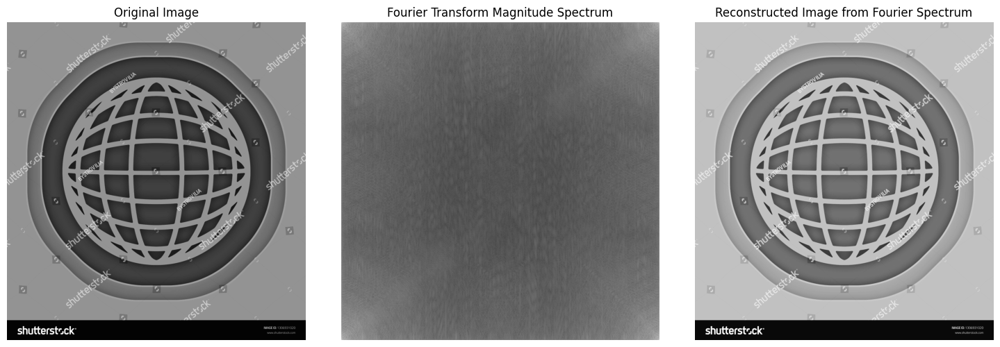

In [45]:
image = cv2.imread("../data/img1.jpg", cv2.IMREAD_GRAYSCALE)

fft_image = fft2(image)
reconstructed_image = np.real(ifft2(fft_image))[0:image.shape[0], 0:image.shape[1]]

plt.figure(figsize=(15, 5))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Magnitude Spectrum of the Fourier Transform
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(np.fft.fftshift(fft_image)) + 1), cmap='gray')  # Use log scale for visibility
plt.title('Fourier Transform Magnitude Spectrum')
plt.axis('off')

# Reconstructed Image
plt.subplot(1, 3, 3)
plt.imshow(np.log(np.abs(reconstructed_image)+1), cmap='gray')  # Use absolute values for display
plt.title('Reconstructed Image from Fourier Spectrum')
plt.axis('off')

plt.tight_layout()
plt.show()

## 2.3

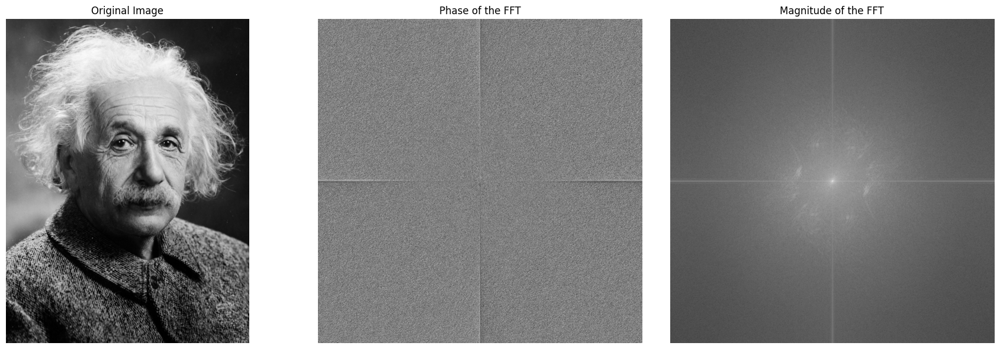

In [46]:
# Compute 2D FFT of ein.jpg
einstein_image = cv2.imread("../data/ein.jpeg", cv2.IMREAD_GRAYSCALE)
fft_image = fft2(einstein_image)

# Shift the zero frequency to the center
einstein_fft_shifted = shift_zero_frequency(fft_image)

# Compute magnitude and phase
magnitude_shifted = np.log(1+np.abs(einstein_fft_shifted))
phase_shifted = np.angle(einstein_fft_shifted)

# Plot original image, phase and magnitude of the FFT
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Original Image
axs[0].imshow(einstein_image, cmap='gray')
axs[0].set_title("Original Image")
axs[0].axis('off')

# Phase of the FFT
axs[1].imshow(phase_shifted, cmap='gray')
axs[1].set_title("Phase of the FFT")
axs[1].axis('off')

# Magnitude of the FFT
axs[2].imshow(magnitude_shifted, cmap='gray')
axs[2].set_title("Magnitude of the FFT")
axs[2].axis('off')

plt.tight_layout()
plt.show()

## 2.4

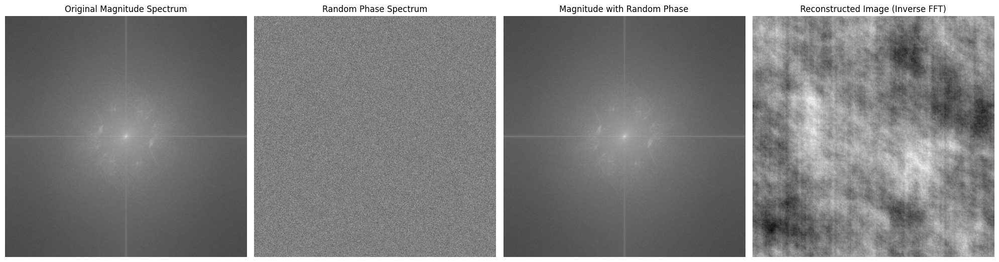

In [93]:
original_magnitude = np.abs(einstein_fft_shifted)
original_phase = np.angle(einstein_fft_shifted)

# Generate a random phase matrix with values between -pi and pi
random_phase = np.random.uniform(0, 2*np.pi, original_phase.shape)

# Create a new FFT with the original magnitude and random phase
modified_fft = original_magnitude * np.exp(1j * random_phase)

# Shift the zero frequency to the center
reconstructed_image_shifted = np.fft.ifftshift(modified_fft)

# Compute the inverse FFT to get the reconstructed image
reconstructed_image = ifft2(reconstructed_image_shifted).real

# Plot the results
fig, axs = plt.subplots(1, 4, figsize=(20, 6))

# Magnitude Spectrum
axs[0].imshow(np.log(1+original_magnitude), cmap='gray')
axs[0].set_title("Original Magnitude Spectrum")
axs[0].axis('off')

# Random Phase Spectrum
axs[1].imshow(random_phase.real, cmap='gray')
axs[1].set_title("Random Phase Spectrum")
axs[1].axis('off')

# Combined FFT (Magnitude + Random Phase)
axs[2].imshow(np.log(1+np.abs(modified_fft)), cmap='gray')
axs[2].set_title("Magnitude with Random Phase")
axs[2].axis('off')

# Inverse FFT Result (Reconstructed Image)
axs[3].imshow(reconstructed_image, cmap='gray')
axs[3].set_title("Reconstructed Image (Inverse FFT)")
axs[3].axis('off')

plt.tight_layout()
plt.show()

## 2.5

In [103]:
# Replace magnitude spectrum with mean magnitude
mean_magnitude = np.mean(original_magnitude)
constant_magnitude = np.full_like(original_magnitude, mean_magnitude)

# Combined fft
combined_fft_constant_magnitude = constant_magnitude * np.exp(1j*original_phase)

# Shift frequency
reconstructed_image_shifted = np.fft.ifftshift(combined_fft_constant_magnitude)

# Reconstruct image
reconstructed_image_constant_magnitude = ifft2(reconstructed_image_shifted).real
final_reconstructed_image = np.where(reconstructed_image_constant_magnitude > 0, 1, 0)

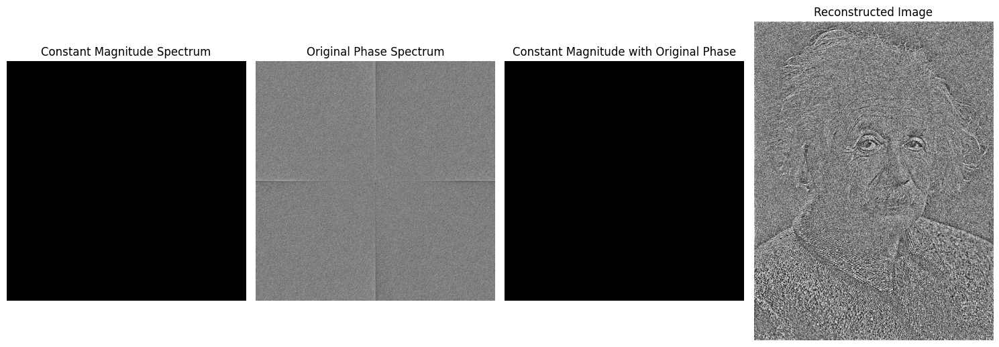

In [106]:
plt.figure(figsize=(15, 10))

# Original Image
plt.subplot(1,4,1)
plt.imshow(np.log(1+np.abs(constant_magnitude)), cmap='gray')
plt.title('Constant Magnitude Spectrum')
plt.axis('off')

# Original Phase Spectrum
plt.subplot(1,4,2)
plt.imshow(original_phase.real, cmap='gray')
plt.title('Original Phase Spectrum')
plt.axis('off')

# Constant magnitude combined with phase
plt.subplot(1,4,3)
plt.imshow(np.log(1+np.abs(combined_fft_constant_magnitude)), cmap='gray')
plt.title('Constant Magnitude with Original Phase')
plt.axis('off')

# Reconstructed Image
plt.subplot(1,4,4)
plt.imshow(final_reconstructed_image[0:einstein_image.shape[0],0:einstein_image.shape[1]], cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Question 3 : Fingerprint Enhancement Using HPF

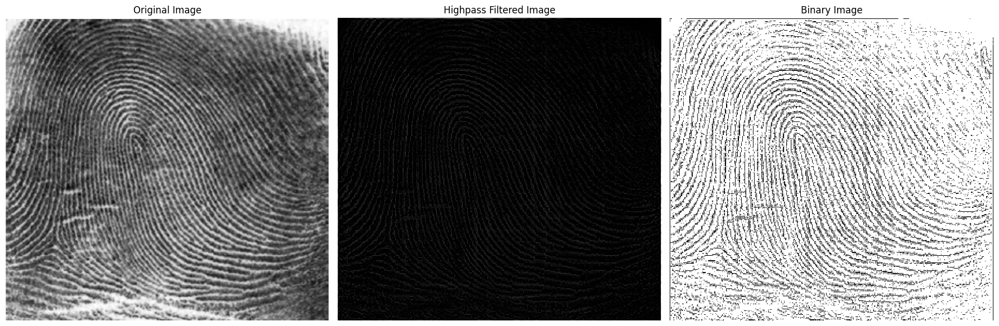

In [478]:
# Read the image in grayscale
image = cv2.imread("../data/fingerprint.png", cv2.IMREAD_GRAYSCALE)

# Apply highpass filter to the image
kernel = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
filtered_image = cv2.filter2D(image, -1, kernel)

# Apply normal binary thresholding
_, binary_image = cv2.threshold(filtered_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Inert the binary image
binary_image = 255 - binary_image

# Display the results
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Original Image
axs[0].imshow(image, cmap='gray')
axs[0].set_title("Original Image")
axs[0].axis('off')

# Filtered Image
axs[1].imshow(filtered_image, cmap='gray')
axs[1].set_title("Highpass Filtered Image")
axs[1].axis('off')

# Binary Image
axs[2].imshow(binary_image, cmap='gray')
axs[2].set_title("Binary Image")
axs[2].axis('off')

plt.tight_layout()
plt.show()

### Explanation
For enhancing the fingerprint, I have used a high-pass filter to identify unique ridge patterns in the image to improve visibility and contrast. Following this, I have applied thresholding to create a binary image that emphasizes the fingerprint ridges more prominently.

#### **Apply Laplacian Filter**
- A high-pass filter allows high-frequency components (like edges and fine details) to pass through while suppressing low-frequency components (such as smooth regions and background noise). 
- Ridges in the fingerprint appear brighter, while valleys (non-ridge areas) become darker.

#### **Thresholding the Enhanced Image**
- I have used OTSU thresholding for creating the binary image.

#### Summary
- The combination of high-pass filtering and thresholding effectively enhances fingerprint images by:
    - Sharpening ridge details.
    - Increasing contrast between ridges and valleys.
    - Producing a binary image that clearly distinguishes fingerprint patterns for easier analysis and matching.

# Question 4: Enhance Image Resolution Using GLPF

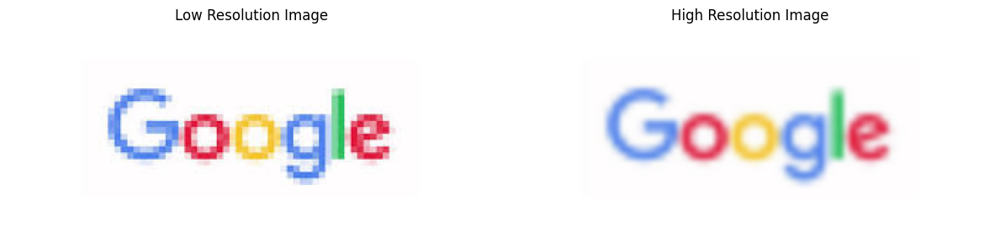

In [15]:
low_res_google = cv2.cvtColor(cv2.imread('../data/google.jpeg'), cv2.COLOR_BGR2RGB)

# Split image to BGR channels
b, g, r = cv2.split(low_res_google)

# Apply Gaussian Low Pass to increase resolution to each channel separately
b_low = cv2.GaussianBlur(b, (7, 7), sigmaX=2, sigmaY=2)
g_low = cv2.GaussianBlur(g, (7, 7), sigmaX=2, sigmaY=2)
r_low = cv2.GaussianBlur(r, (7, 7), sigmaX=2, sigmaY=2)

# Merge the channels back
high_res_google_only_low_pass = cv2.merge([b_low, g_low, r_low])

# Display the images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(low_res_google)
plt.title('Low Resolution Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(high_res_google_only_low_pass)
plt.title('High Resolution Image')
plt.axis('off')

plt.tight_layout()
plt.show()


### Explanation
For enhancing the resolution of google.jpeg, I have used a Guassian Low Pass Filter. As an effect, the pixelated structure of the image is smoothened out and a clear and more readable image with higher resolution is achieved.

# Question 5: Image Restoration From Notch Filter

## 5.1

In [8]:
def create_notch_filter(shape, d0, lines, width=5):
    """
    Create a notch filter mask
    
    Parameters:
    shape: tuple of image shape (M, N)
    d0: distance from the center where notch should be placed
    lines: list of angles in degrees for the notch lines
    width: width of the notch in pixels
    
    Returns:
    2D numpy array of filter mask
    """
    rows, cols = shape
    center_x, center_y = rows//2, cols//2
    
    # Initialize filter mask
    mask = np.ones(shape, dtype=np.float32)
    
    y, x = np.ogrid[-center_x:rows-center_x, -center_y:cols-center_y]
    
    # Create notches for each specified angle
    for angle_deg in lines:
        angle_rad = np.deg2rad(angle_deg)
        
        # Rotate coordinates
        x_rot = x * np.cos(angle_rad) + y * np.sin(angle_rad)
        y_rot = -x * np.sin(angle_rad) + y * np.cos(angle_rad)
        
        # Create notch line
        notch = np.abs(x_rot) < width
        
        # Apply distance constraint
        dist_from_center = np.sqrt(x**2 + y**2)
        notch = notch & (dist_from_center > d0)
        
        # Apply notch to mask
        mask[notch] = 0
    
    return mask

def apply_notch_filter(image, d0=30, width=5):
    """
    Apply combined vertical, horizontal, and diagonal notch filters
    
    Parameters:
    image: input image (grayscale)
    d0: distance from center where notch starts
    width: width of the notch lines
    
    Returns:
    filtered image
    """
    # Convert image to float32
    img_float = image.astype(np.float32)
    
    # Apply FFT
    f_transform = np.fft.fft2(img_float)
    f_shift = np.fft.fftshift(f_transform)
    
    # Create notch filter mask
    # 0° (vertical), 90° (horizontal), 45° and 135° (diagonals)
    angles = [0, 90, 110]
    mask = create_notch_filter(image.shape, d0, angles, width)
    
    # Apply filter
    f_filtered = f_shift * mask
    
    # Inverse FFT
    f_ishift = np.fft.ifftshift(f_filtered)
    img_filtered = np.fft.ifft2(f_ishift)
    
    # Convert back to real values and uint8
    img_filtered = np.abs(img_filtered)
    img_filtered = cv2.normalize(img_filtered, None, 0, 255, cv2.NORM_MINMAX)
    
    return img_filtered.astype(np.uint8)

def visualize_spectrum(image):
    """
    Visualize the magnitude spectrum of an image
    
    Parameters:
    image: input image
    
    Returns:
    magnitude spectrum visualization
    """
    f_transform = np.fft.fft2(image.astype(np.float32))
    f_shift = np.fft.fftshift(f_transform)
    magnitude_spectrum = 20*np.log(np.abs(f_shift) + 1)
    magnitude_spectrum = cv2.normalize(magnitude_spectrum, None, 0, 255, cv2.NORM_MINMAX)
    return magnitude_spectrum.astype(np.uint8)

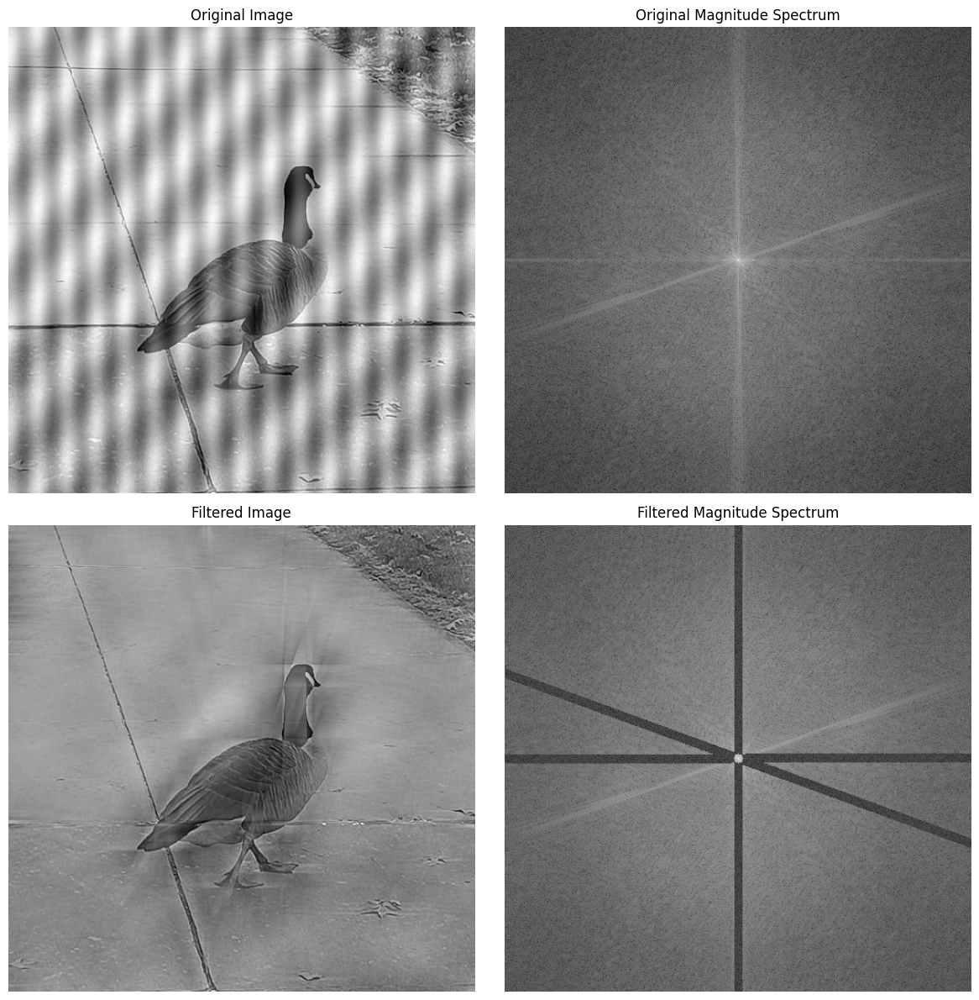

In [10]:
image = cv2.imread('../data/bird.png', cv2.IMREAD_GRAYSCALE)
filtered_image = apply_notch_filter(image, d0=5, width=5)

original_spectrum = visualize_spectrum(image)
filtered_spectrum = visualize_spectrum(filtered_image)

# Display the results
fig, axs = plt.subplots(2, 2, figsize=(12, 12))

axs[0, 0].imshow(image, cmap='gray')
axs[0, 0].set_title('Original Image')
axs[0, 0].axis('off')

axs[0, 1].imshow(original_spectrum, cmap='gray')
axs[0, 1].set_title('Original Magnitude Spectrum')
axs[0, 1].axis('off')

axs[1, 0].imshow(filtered_image, cmap='gray')
axs[1, 0].set_title('Filtered Image')
axs[1, 0].axis('off')

axs[1, 1].imshow(filtered_spectrum, cmap='gray')
axs[1, 1].set_title('Filtered Magnitude Spectrum')
axs[1, 1].axis('off')

plt.tight_layout()
plt.show()

### Method 2

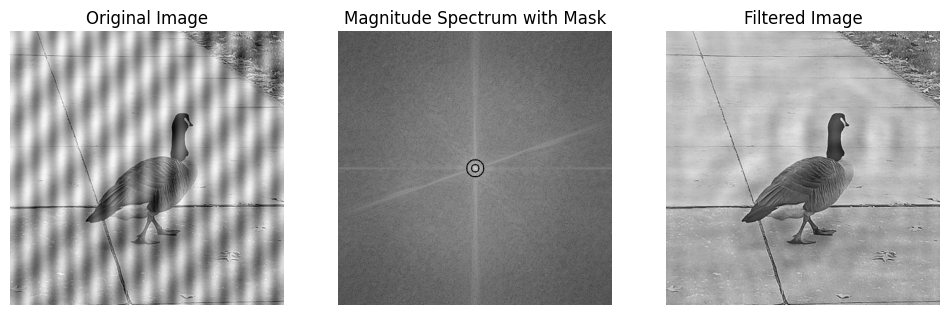

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale
bird_image = cv2.imread('../data/bird.png', cv2.IMREAD_GRAYSCALE)

# Perform Fourier Transform
dft = np.fft.fft2(bird_image)
dft_shifted = np.fft.fftshift(dft)

# Define the band-reject filter parameters
rows, cols = bird_image.shape
crow, ccol = rows // 2, cols // 2  # Center of the frequency domain

# Band-reject filter parameters for the two concentric circles
d0_1 = 7  # Radius for the first circle
w_1 = 2    # Width of the first band

d0_2 = 16  # Radius for the second circle
w_2 = 2    # Width of the second band

# Create a mask with concentric circles
mask = np.ones((rows, cols), np.uint8)  # Start with a mask of all ones
for u in range(rows):
    for v in range(cols):
        d = np.sqrt((u - crow)**2 + (v - ccol)**2)
        # Set pixels within the defined ranges to zero (band-reject)
        if d0_1 - w_1/2 <= d <= d0_1 + w_1/2 or d0_2 - w_2/2 <= d <= d0_2 + w_2/2:
            mask[u, v] = 0

# Apply the mask to the shifted DFT
filtered_dft_shifted = dft_shifted * mask

# Perform the inverse shift and inverse DFT to get the filtered image
filtered_dft = np.fft.ifftshift(filtered_dft_shifted)
filtered_image = np.fft.ifft2(filtered_dft)
filtered_image = np.abs(filtered_image)

# Plot the results
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(bird_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Magnitude Spectrum with Mask")
magnitude_spectrum = 20 * np.log(np.abs(dft_shifted) + 1)
plt.imshow(magnitude_spectrum * mask, cmap='gray')  # Apply the mask to the spectrum for visualization
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Filtered Image")
plt.imshow(filtered_image, cmap='gray')
plt.axis('off')

plt.show()

### Explanation
Notch filter is used to remove specific frequencies that contribute to noise in an image.
#### Method 1
Steps followed:
- Take a fourier transform of the image to shift from spatial to frequency domain.
- Shift the fourier transform to bring the lowest frequency component to the center for easier and better visualisation.
- Using the magnitude spectrum, identify the angles at which noise is present.
- Next step is to create the notch filter.
    - To align the notch filter with the specified angle, the code rotates the x and y coordinates by the angle. This rotated grid (x_rot, y_rot) allows us to create a notch along the desired angle.
    - A notch line is created by setting a condition on the rotated x coordinate (np.abs(x_rot) < width). This condition defines a narrow strip centered around x_rot = 0 with a width specified by width. Frequencies within this strip will be zeroed out, effectively blocking them.
    - A distance constraint (dist_from_center > d0) is added to ensure that the notch line is not applied too close to the center (low frequencies). 
    - For this question, notch filters are created at angles 0,90 and 110 according to the noise.
- The fourier transform is then multiplied with this mask to remove the frequencies corresponding to noise.
- Finally we take a inverse fourier transfer to go back to the spatial domain. Before doing so we shift it back to its original state.

### Method 2
- A second approach could be using band reject filter.
- Two bands are defined by radii and widths:
    - The first band is defined by 7 (radius of the band) and 2 (width of the band).
    - The second band is defined by 16 (radius of the band) and 2 (width of the band). 
- If the distance d falls within the specified range of either band, the mask value at that point is set to zero. This effectively blocks frequencies in these bands.
- The mask values are one outside these ranges, allowing other frequencies to pass through.
- This filter is then applied to the fourier transform of the image as mentioned in method 1.
- Finally we take a inverse fourier transfer to go back to the spatial domain. Before doing so we shift it back to its original state.

## 5.2

In [12]:
def notch_filter(shape, notch_centers, d0=10):
    """
    Create a notch filter to block frequencies around specified centers.
    Args:
        shape (tuple): Shape of the filter (rows, cols).
        notch_centers (list of tuples): List of frequency coordinates to block (u, v).
        d0 (int): Radius around each notch center to block.
    Returns:
        np.ndarray: Notch filter mask.
    """
    rows, cols = shape

    mask = np.ones((rows, cols), np.float32)
    for (u, v) in notch_centers:
        for x in range(rows):
            for y in range(cols):
                d = np.sqrt((x - u)**2 + (y - v)**2)
                if d < d0:
                    mask[x, y] = 0
                d = np.sqrt((x - (rows - u))**2 + (y - (cols - v))**2)
                if d < d0:
                    mask[x, y] = 0
    return mask

# Function to find notch centers from the magnitude spectrum using a threshold
def find_notch_centers(magnitude, threshold=100, exclusion_radius=20):
    rows, cols = magnitude.shape
    u_center, v_center = rows // 2, cols // 2

     # Create a binary mask where magnitude > threshold
    mask = magnitude > threshold
    
    # Use np.where to find coordinates of True values (which represent notch centers)
    notch_centers = np.column_stack(np.where(mask))  # (row, col) coordinates

    # Filter out points within the exclusion region around the center
    filtered_notch_centers = []
    for (row, col) in notch_centers:
        # Calculate the distance from the center
        distance = np.sqrt((row - u_center)**2 + (col - v_center)**2)
        
        # Only add the point if it is outside the exclusion radius
        if distance > exclusion_radius:
            filtered_notch_centers.append((row, col))
    
    return np.array(filtered_notch_centers)

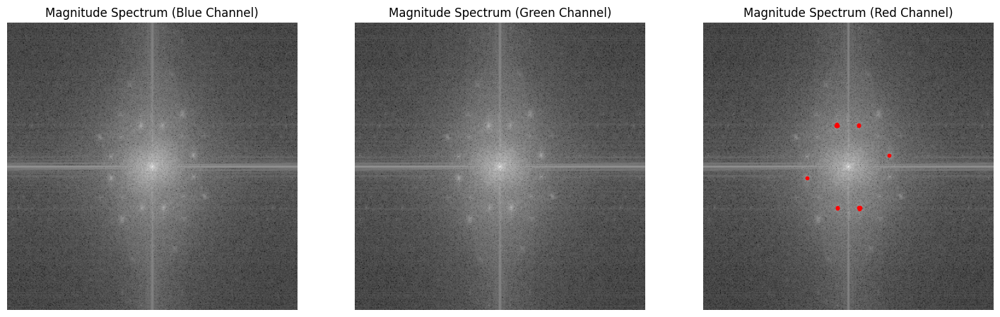

In [13]:
# Load the image in grayscale
cart = cv2.cvtColor(cv2.imread('../data/cart.jpg'), cv2.COLOR_BGR2RGB)

# Extract channels
b, g, r = cv2.split(cart)

# Apply FFT to all channels
b_fft = np.fft.fft2(b)
g_fft = np.fft.fft2(g)
r_fft = np.fft.fft2(r)

# Shift the zero frequency to the center
b_fft_shifted = np.fft.fftshift(b_fft)
g_fft_shifted = np.fft.fftshift(g_fft)
r_fft_shifted = np.fft.fftshift(r_fft)

# Calculate the magnitude spectrum
b_magnitude = np.abs(b_fft_shifted)
g_magnitude = np.abs(g_fft_shifted)
r_magnitude = np.abs(r_fft_shifted)

# Find notch centers from the magnitude spectrum
notch_centers = find_notch_centers(b_magnitude, threshold = 80000, exclusion_radius=40)

# Display magnitude spectrum of all channels and the notch centers
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(np.log(1 + b_magnitude), cmap='gray')
plt.title('Magnitude Spectrum (Blue Channel)')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(np.log(1 + g_magnitude), cmap='gray')
plt.title('Magnitude Spectrum (Green Channel)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(np.log(1 + r_magnitude), cmap='gray')
plt.title('Magnitude Spectrum (Red Channel)')
plt.axis('off')

# Plot the notch centers on the magnitude spectrum
plt.scatter(notch_centers[:, 1], notch_centers[:, 0], color='red', s=10)
plt.show()

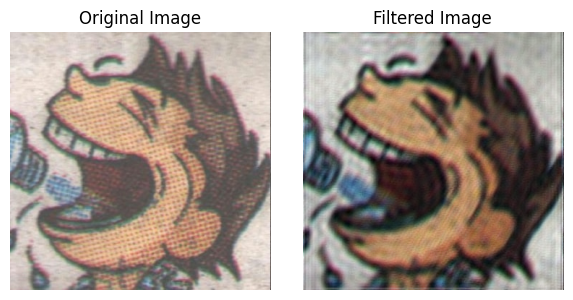

In [14]:
# Create a notch filter mask
notch_mask = notch_filter(b_magnitude.shape, notch_centers, d0=30)

# Apply the notch filter to the FFT of each channel
f_transform_shift_filtered_b = b_fft_shifted * notch_mask
f_transform_shift_filtered_g = g_fft_shifted * notch_mask
f_transform_shift_filtered_r = r_fft_shifted * notch_mask

# Inverse FFT for each channel
f_ishift_b = np.fft.ifftshift(f_transform_shift_filtered_b)
cart_filtered_b = np.fft.ifft2(f_ishift_b)

f_ishift_g = np.fft.ifftshift(f_transform_shift_filtered_g)
cart_filtered_g = np.fft.ifft2(f_ishift_g)

f_ishift_r = np.fft.ifftshift(f_transform_shift_filtered_r)
cart_filtered_r = np.fft.ifft2(f_ishift_r)

# Convert back to real values and uint8
cart_filtered_b = np.abs(cart_filtered_b)
cart_filtered_b = cv2.normalize(cart_filtered_b, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

cart_filtered_g = np.abs(cart_filtered_g)
cart_filtered_g = cv2.normalize(cart_filtered_g, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

cart_filtered_r = np.abs(cart_filtered_r)
cart_filtered_r = cv2.normalize(cart_filtered_r, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Merge the filtered channels
cart_filtered = cv2.merge([cart_filtered_b, cart_filtered_g, cart_filtered_r])

# Display the and original image
plt.figure(figsize=(6, 3))

plt.subplot(1, 2, 1)
plt.imshow(cart)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cart_filtered)
plt.title('Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

### Explanation
- Plotting the magnitude spectrum of the fourier transform of the image reveals that the noise is not periodic. Thus we have to identify specific regions of noise and apply circular notch filters to remove those frequencies.
- To do the same, first plot the magnitude spectrum by taking a fourier transform.
- Then using intensity threshold, identify regions of high frequency. These are our notch filter centers.
- For each pixel (x, y) in the mask (representing a point in the frequency domain), the code computes the Euclidean distance d between the pixel and the specified notch center (u, v).
- If this distance is less than d0, the pixel (x, y) in the mask is set to zero, effectively blocking this frequency.
- The code also calculates the distance to the symmetric point (rows - u, cols - v)— this mirrors the notch center across the center of the frequency domain, ensuring that symmetric frequencies are also blocked.
- This filter is then applied to the image in the frequency domain.
- Lastly, an inverse fourier transform is taken to get the final output.

# Question 6: Count Coins

Number of coins detected: 5


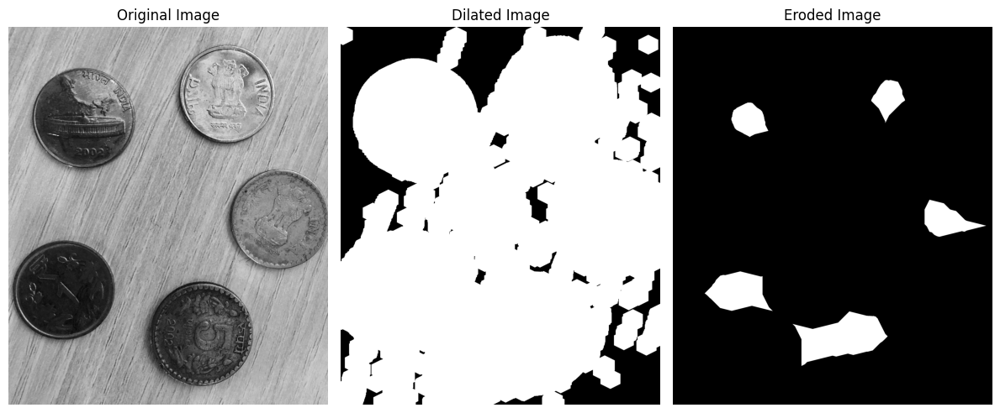

In [7]:
# Load the image and convert it to grayscale
image = cv2.imread('../data/coin-detection.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Threshold the image
_, thresh = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)

# Create circular sturcturing element
kernel_dilation = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
kernel_erosion = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))

# Perform dilation on image
dilated = cv2.dilate(thresh, kernel_dilation, iterations=35)

# Perform erosion on image
eroded = cv2.erode(dilated, kernel_erosion, iterations=45)

# Use cv2.connectedComponents to count the number of distinct white regions
_, markers = cv2.connectedComponents(eroded)
num_coins = np.max(markers)

print(f"Number of coins detected: {num_coins}")

# Display the images
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(gray, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(dilated, cmap='gray')
plt.title('Dilated Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(eroded, cmap='gray')
plt.title('Eroded Image')
plt.axis('off')

plt.tight_layout()
plt.show()

### Explanation
- For counting the number of coins, we first threshold the image to identify the foreground and background.
- For certain coins, the thresholding separated it from the background however for some only the boundaries were detected.
- We then perform dilation to fill in the holes that could not be detected as foreground by thresholding.
- After filling of all holes, erosion is done to separate the foreground components to discrete regions.
- Finally we need to count the number of white regions. This is done using `cv.connectedComponents`.

# Question 7: Skeletonization

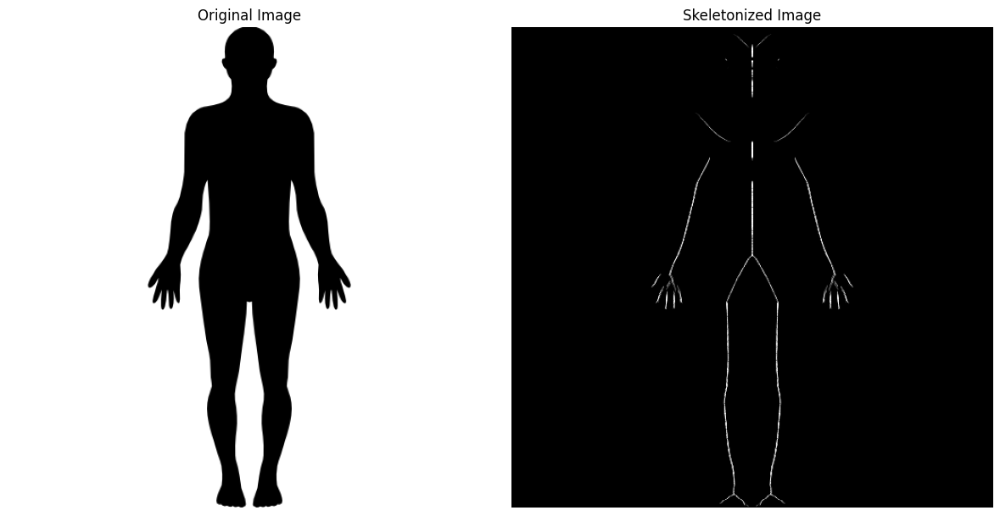

In [6]:
# Load the image
orig_image = cv2.imread('../data/human.png', cv2.IMREAD_UNCHANGED)

# Extract only one channel
image = orig_image[:, :, 3]

# Create an empty skeleton image
skeleton = np.zeros(image.shape, np.uint8)

# Get a structuring element (kernel) for morphological operations
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))

# Iteratively apply morphological operations until the image is fully eroded
while True:
    # Erode the binary image
    eroded = cv2.erode(image, kernel)
    
    # Perform an opening (erosion followed by dilation) to remove small noise
    temp = cv2.dilate(eroded, kernel)
    temp = cv2.subtract(image, temp)
    
    # Add the result to the skeleton
    skeleton = cv2.bitwise_or(skeleton, temp)
    
    # Update the binary image for the next iteration
    image = eroded.copy()
    
    # If the entire image is eroded, break the loop
    if cv2.countNonZero(image) == 0:
        break

# Display the skeletonized image
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(orig_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(skeleton, cmap='gray')
plt.title('Skeletonized Image')
plt.axis('off')

plt.tight_layout()
plt.show()

### Explanation
Skeletomization is reducing the image to a width of one pixel. This is done as follows:
- An empty skeleton image is created, initialized to zeros (all black). This will store the final skeletonized structure.
- The structuring element is a cross-shaped 3x3 kernel, which is suitable for capturing the skeletal structure.
- The process runs in a loop, performing morphological operations repeatedly until the image is completely eroded.
- Each iteration begins by eroding the current image using the structuring element. Erosion shrinks the white regions (foreground) in the binary image by removing pixels from the boundaries of objects.
- After erosion, a dilation operation is applied to eroded, forming an "opening" operation (erosion followed by dilation). This step is used to remove small noise and separate the outermost pixels of the skeleton.
- The temp image now contains the outermost layer of the skeleton for the current iteration. This layer is added to skeleton using bitwise_or, accumulating the skeleton pixels over each iteration.
- The image is updated with the eroded result for the next iteration, making it progressively smaller until all pixels are removed.
- The loop stops when image has no non-zero pixels left, meaning it has been fully eroded.

# Question 8: Fingerprint Enhancement Using Gabor Filter

In [1]:
def apply_gabor_filter(img, ksize=31, sigma=4.0, lambd=10.0, gamma=0.5):
    # capture both orientation and frequency-specific information
    gabor_sum = np.zeros_like(img, dtype=np.float32)
    for theta in np.arange(0, np.pi, np.pi / 8):
        kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, 0, ktype=cv2.CV_32F)
        filtered_img = cv2.filter2D(img, cv2.CV_32F, kernel)
        gabor_sum += filtered_img
    return cv2.normalize(gabor_sum, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

In [2]:
def skeletonize(img):
    skel = np.zeros(img.shape, np.uint8)  # Initialize the skeleton
    temp_img = img.copy()  # Copy the original image
    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))  # Structuring element for erosion and dilation
    
    while True:
        # Perform opening (erosion followed by dilation)
        eroded = cv2.erode(temp_img, element)  # Erode the image
        open_img = cv2.dilate(eroded, element)  # Dilate the eroded image
        
        # Subtract the opened image from the original image to get edges
        temp = cv2.subtract(temp_img, open_img)
        
        # Combine the skeleton with the extracted edges
        skel = cv2.bitwise_or(skel, temp)
        
        # Prepare for the next iteration by eroding temp_img
        temp_img = eroded.copy()
        
        # Stop if there's nothing left to erode
        if cv2.countNonZero(temp_img) == 0:
            break
            
    return skel

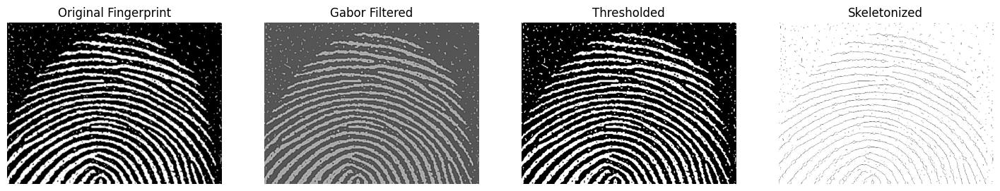

In [5]:
fingerprint = cv2.imread('../data/fingerprint2.png', cv2.IMREAD_GRAYSCALE)
filtered = apply_gabor_filter(fingerprint)
binary = cv2.threshold(filtered, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
skeletonized = skeletonize(binary)

plt.figure(figsize=(18, 8))
plt.subplot(1, 4, 1)
plt.imshow(fingerprint, cmap='gray')
plt.title('Original Fingerprint')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(filtered, cmap='gray')
plt.title('Gabor Filtered')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(binary, cmap='gray')
plt.title('Thresholded')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(255-skeletonized, cmap='gray')
plt.title('Skeletonized')
plt.axis('off')

plt.show()

### Explanation
- For enhancing the fingerprint, first Gabor filter has been applied.
- Then the enhanced fingerprint in thresholded to create binary image.
- Finally the image is skeletonized to clearly see the ridges.